# Property Price Prediction 

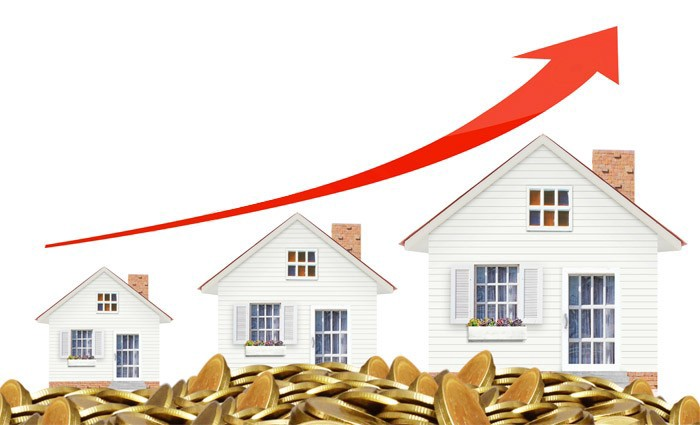

## Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
%matplotlib inline

## Importing the Data

In [27]:
pdata = pd.read_csv(r'E:\Imarticus_ML_Datasets\ProjectonPropertyPricePrediction\Dataset\HousePrices.csv')

## Data Exploration

In [28]:
pdata.head(10)

,Id,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [29]:
pd.options.display.max_rows = None

In [30]:
pdata.isnull().sum()

Id                        0
Dwell_Type                0
Zone_Class                0
LotFrontage             320
LotArea                   0
Road_Type                 0
Alley                  1944
Property_Shape            0
LandContour               0
Utilities                 0
LotConfig                 0
LandSlope                 0
Neighborhood              0
Condition1                0
Condition2                0
Dwelling_Type             0
HouseStyle                0
OverallQual               0
OverallCond               0
YearBuilt                 0
YearRemodAdd              0
RoofStyle                 0
RoofMatl                  0
Exterior1st               0
Exterior2nd               0
MasVnrType               14
MasVnrArea               14
ExterQual                 0
ExterCond                 0
Foundation                0
BsmtQual                 59
BsmtCond                 59
BsmtExposure             61
BsmtFinType1             59
BsmtFinSF1                0
BsmtFinType2        

In [31]:
pdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 81 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   2073 non-null   int64  
 1   Dwell_Type           2073 non-null   int64  
 2   Zone_Class           2073 non-null   object 
 3   LotFrontage          1753 non-null   float64
 4   LotArea              2073 non-null   int64  
 5   Road_Type            2073 non-null   object 
 6   Alley                129 non-null    object 
 7   Property_Shape       2073 non-null   object 
 8   LandContour          2073 non-null   object 
 9   Utilities            2073 non-null   object 
 10  LotConfig            2073 non-null   object 
 11  LandSlope            2073 non-null   object 
 12  Neighborhood         2073 non-null   object 
 13  Condition1           2073 non-null   object 
 14  Condition2           2073 non-null   object 
 15  Dwelling_Type        2073 non-null   o

## Data Cleaning

In [32]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [33]:
# Perantage of null values in each columns
pdata.isnull().sum() * 100 / pdata.shape[0]

Id                      0.000000
Dwell_Type              0.000000
Zone_Class              0.000000
LotFrontage            15.436565
LotArea                 0.000000
Road_Type               0.000000
Alley                  93.777135
Property_Shape          0.000000
LandContour             0.000000
Utilities               0.000000
LotConfig               0.000000
LandSlope               0.000000
Neighborhood            0.000000
Condition1              0.000000
Condition2              0.000000
Dwelling_Type           0.000000
HouseStyle              0.000000
OverallQual             0.000000
OverallCond             0.000000
YearBuilt               0.000000
YearRemodAdd            0.000000
RoofStyle               0.000000
RoofMatl                0.000000
Exterior1st             0.000000
Exterior2nd             0.000000
MasVnrType              0.675350
MasVnrArea              0.675350
ExterQual               0.000000
ExterCond               0.000000
Foundation              0.000000
BsmtQual  

In [34]:
drop_col = pdata.columns[pdata.isnull().sum() * 100 / pdata.shape[0]>40]
drop_col

Index(['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], dtype='object')

In [35]:
# Droping the columns having more than 40% null values
pdata.drop(drop_col,axis=1,inplace=True)

In [36]:
pdata.drop('Id',axis=1,inplace=True)

### Filling Null Values

In [37]:
#Filling nul values with mean
pdata['LotFrontage'].fillna(pdata['LotFrontage'].mean(), inplace=True)
pdata['MasVnrArea'].fillna(pdata['MasVnrArea'].mean(), inplace=True)
pdata['BsmtFinSF1'].fillna(pdata['BsmtFinSF1'], inplace=True)
pdata['BsmtFinSF2'].fillna(pdata['BsmtFinSF2'], inplace=True)
#-------------------------------------------------------------------------------
pdata['Exterior1st'].fillna("VinylSd", inplace=True)
pdata['Exterior2nd'].fillna("VinylSd", inplace=True)
pdata['MasVnrType'].fillna("None", inplace=True)
pdata['BsmtQual'].fillna("TA", inplace=True)
pdata['BsmtCond'].fillna("Gd", inplace=True)
pdata['BsmtExposure'].fillna("No", inplace=True)
pdata['BsmtFinType1'].fillna("ALQ", inplace=True)
pdata['BsmtFinType2'].fillna("ALQ", inplace=True)
pdata['Electrical'].fillna("SBrkr", inplace=True)
pdata['BsmtUnfSF'].fillna(0.0, inplace=True)
pdata['TotalBsmtSF'].fillna(0.0, inplace=True)
pdata['BsmtFullBath'].fillna(0.0, inplace=True)
pdata['BsmtHalfBath'].fillna(0.0, inplace=True)
pdata['KitchenQual'].fillna("TA", inplace=True)
pdata['Functional'].fillna("Typ", inplace=True)
pdata['GarageType'].fillna("Attchd", inplace=True)
pdata['GarageYrBlt'].fillna(2013, inplace=True)
pdata['GarageFinish'].fillna("Fin", inplace=True)
pdata['GarageQual'].fillna("TA", inplace=True)
pdata['GarageCond'].fillna("TA", inplace=True)

### Converting Categorical to Numerical values

In [45]:
pdata.Zone_Class = pdata.Zone_Class.replace({'RL':0,'RM':1,'RH':2,'C (all)':3,'FV':4})
pdata.Road_Type = le.fit_transform(pdata.Road_Type)
pdata.Property_Shape = pdata.Property_Shape.replace({'IR1':0,'IR2':1,'IR3':2,'Reg':3})
pdata.LandContour = pdata.LandContour.replace({'Lvl':0,'Bnk':1,'HLS':2,'Low':3})
pdata.Utilities = pdata.Utilities.replace({'AllPub':1,'NoSeWa':0})
pdata.LotConfig = pdata.LotConfig.replace({'Inside':0,'Corner':1,'CulDSac':2,'FR2':3,'FR3':4})
pdata.LandSlope = pdata.LandSlope.replace({'Sev':0,'Mod':1,'Gtl':2})
pdata.Neighborhood = le.fit_transform(pdata.Neighborhood)
pdata.Condition1 = le.fit_transform(pdata.Condition1)
pdata.Condition2 = le.fit_transform(pdata.Condition2)
pdata.Dwelling_Type = pdata.Dwelling_Type.replace({'1Fam':0,'2fmCon':1,'Duplex':2,'TwnhsE':3,'Twnhs':4})
pdata.HouseStyle = pdata.HouseStyle.replace({'1Story':0,'1.5Unf':1,'1.5Fin':2,'2Story':3,'2.5Unf':4,'2.5Fin':5,'SFoyer':6,'SLvl':7})
pdata.RoofStyle = pdata.RoofStyle.replace({'Flat':0,'Gable':1,'Gambrel':2,'Hip':3,'Mansard':4,'Shed':5})
pdata.RoofMatl = pdata.RoofMatl.replace({'ClyTile':0,'CompShg':1,'Membran':2,'Metal':3,'Roll':4,'Tar&Grv':5,'WdShake':6,'WdShngl':7})
pdata.Exterior1st = le.fit_transform(pdata.Exterior1st)
pdata.Exterior2nd = le.fit_transform(pdata.Exterior2nd)
pdata.MasVnrType = pdata.MasVnrType.replace({'None':0,'BrkCmn':1,'BrkFace':2,'Stone':3})
pdata.ExterQual = pdata.ExterQual.replace({'Fa':0,'TA':1,'Gd':2,'Ex':3})
pdata.ExterCond = pdata.ExterCond.replace({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
pdata.Foundation = pdata.Foundation.replace({'BrkTil':0,'CBlock':1,'PConc':2,'Slab':3,'Stone':4,'Wood':5})
pdata.BsmtQual = pdata.BsmtQual.replace({'Fa':0,'TA':1,'Gd':2,'Ex':3})
pdata.BsmtCond = pdata.BsmtCond.replace({'Po':0,'Fa':1,'TA':2,'Gd':3})
pdata.BsmtExposure = pdata.BsmtExposure.replace({'No':0,'Mn':1,'Av':2,'Gd':3})
pdata.BsmtFinType1 = pdata.BsmtFinType1.replace({'Unf':0,'LwQ':1,'Rec':2,'BLQ':3,'ALQ':4,'GLQ':5})
pdata.BsmtFinType2 = pdata.BsmtFinType2.replace({'Unf':0,'LwQ':1,'Rec':2,'BLQ':3,'ALQ':4,'GLQ':5})
pdata.Heating = pdata.Heating.replace({'Floor':0,'GasA':1,'GasW':2,'Grav':3,'OthW':4,'Wall':5})
pdata.HeatingQC = pdata.HeatingQC.replace({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
pdata.CentralAir = pdata.CentralAir.replace({'N':0,'Y':1})
pdata.Electrical = pdata.Electrical.replace({'FuseP':0,'FuseF':1,'FuseA':2,'Mix':3,'SBrkr':4})
pdata.KitchenQual = pdata.KitchenQual.replace({'Fa':0,'TA':1,'Gd':2,'Ex':3})
pdata.Functional = pdata.Functional.replace({'Sev':0,'Maj2':1,'Maj1':2,'Mod':3,'Min2':4,'Min1':5,'Typ':6})
pdata.GarageType = pdata.GarageType.replace({'Detchd':0,'CarPort':1,'BuiltIn':2,'Basment':3,'Attchd':4,'2Types':5})
pdata.GarageFinish = pdata.GarageFinish.replace({'Unf':0,'RFn':1,'Fin':2})
pdata.GarageQual = pdata.GarageQual.replace({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
pdata.GarageCond = pdata.GarageCond.replace({'Po':0,'Fa':1,'TA':2,'Gd':3,'Ex':4})
pdata.PavedDrive = pdata.PavedDrive.replace({'N':0,'P':1,'Y':2})
pdata.SaleType = le.fit_transform(pdata.SaleType)
pdata.SaleCondition = le.fit_transform(pdata.SaleCondition)

In [47]:
corr_matrix = pdata.corr()
corr_matrix

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
Dwell_Type,1.000000,0.059634,-0.075289,-0.033609,-0.005419,0.003992,-0.015459,0.009657,-0.018257,-0.068747,...,-0.006529,-0.011966,-0.012021,0.001625,-0.003942,-0.020589,0.018891,0.011964,0.005838,-0.017399
Zone_Class,0.059634,1.000000,-0.156737,-0.107450,-0.066778,0.165090,0.013626,0.015914,-0.041147,0.028409,...,0.041672,-0.024932,-0.060741,-0.025695,-0.016283,0.029227,-0.015322,-0.060209,-0.008116,-0.057698
LotFrontage,-0.075289,-0.156737,1.000000,0.240528,-0.039099,-0.118032,0.097053,0.009892,0.028930,-0.079794,...,-0.002113,0.037639,0.019810,0.111869,-0.002122,0.023024,0.023630,-0.023333,0.054481,0.268354
LotArea,-0.033609,-0.107450,0.240528,1.000000,-0.144528,-0.138348,0.282101,-0.015111,0.107727,-0.357898,...,-0.023199,0.010594,0.035370,0.062458,0.030949,-0.001707,-0.006478,0.005604,0.032000,0.211572
Road_Type,-0.005419,-0.066778,-0.039099,-0.144528,1.000000,0.001219,-0.125899,-0.002650,-0.007254,0.191610,...,0.024585,0.007737,-0.015122,0.004280,-0.023924,0.007443,-0.049654,0.021432,-0.003179,0.054667
Property_Shape,0.003992,0.165090,-0.118032,-0.138348,0.001219,1.000000,-0.137607,0.051848,-0.242101,0.098417,...,0.078943,-0.030240,-0.046240,-0.027427,-0.026401,-0.044820,0.021285,0.001076,-0.025958,-0.259368
LandContour,-0.015459,0.013626,0.097053,0.282101,-0.125899,-0.137607,1.000000,0.011893,-0.018287,-0.552746,...,0.000676,0.038545,0.008420,-0.009105,-0.014397,0.045897,-0.059318,0.026919,0.011769,0.062296
Utilities,0.009657,0.015914,0.009892,-0.015111,-0.002650,0.051848,0.011893,1.000000,-0.078494,-0.008837,...,0.013443,0.004230,-0.153756,0.002340,0.003520,0.074844,-0.032878,0.177783,0.125765,0.021040
LotConfig,-0.018257,-0.041147,0.028930,0.107727,-0.007254,-0.242101,-0.018287,-0.078494,1.000000,-0.001876,...,-0.020762,0.087379,-0.001933,0.042023,0.020218,0.003648,0.018465,-0.005982,-0.035333,0.086699
LandSlope,-0.068747,0.028409,-0.079794,-0.357898,0.191610,0.098417,-0.552746,-0.008837,-0.001876,1.000000,...,0.011931,-0.001925,-0.044441,0.014269,0.004489,0.002735,0.012042,-0.061987,0.034126,-0.038989


In [17]:
pdata[pdata.columns[1:]].corr()['Property_Sale_Price'][:]

LotFrontage            0.268354
LotArea                0.211572
Road_Type              0.054667
Property_Shape        -0.259368
Utilities              0.021040
LotConfig              0.086699
LandSlope             -0.038989
Neighborhood           0.199664
Condition1             0.092759
Condition2             0.004434
Dwelling_Type         -0.111445
HouseStyle             0.044718
OverallQual            0.523553
OverallCond           -0.049926
YearBuilt              0.437662
YearRemodAdd           0.475565
RoofStyle              0.208908
RoofMatl               0.145356
Exterior1st            0.117839
Exterior2nd            0.110669
MasVnrType             0.416776
MasVnrArea             0.480394
ExterQual              0.686049
ExterCond              0.018678
Foundation             0.385260
BsmtQual               0.648882
BsmtCond               0.055409
BsmtExposure           0.349752
BsmtFinType1           0.244067
BsmtFinSF1             0.373276
BsmtFinType2          -0.133771
BsmtFinS

### Scaling

In [48]:
from sklearn import preprocessing
names = pdata.columns
prepro = preprocessing.normalize(pdata)
pdata_scaled = pd.DataFrame(prepro, columns=names)

In [49]:
pdata_scaled.head()

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
0,0.000287,0.0,0.000311,0.040484,0.000005,0.000014,0.0,0.000005,0.000000,0.000010,...,0.000000,0.0,0.0,0.0,0.0,0.000010,0.009620,0.000038,0.000019,0.998927
1,0.000110,0.0,0.000440,0.052801,0.000006,0.000017,0.0,0.000006,0.000017,0.000011,...,0.000000,0.0,0.0,0.0,0.0,0.000028,0.011039,0.000044,0.000022,0.998274
2,0.000268,0.0,0.000304,0.050261,0.000004,0.000000,0.0,0.000004,0.000000,0.000009,...,0.000000,0.0,0.0,0.0,0.0,0.000040,0.008971,0.000036,0.000018,0.998511
3,0.000499,0.0,0.000427,0.068019,0.000007,0.000000,0.0,0.000007,0.000007,0.000014,...,0.001937,0.0,0.0,0.0,0.0,0.000014,0.014288,0.000057,0.000000,0.997139
4,0.000240,0.0,0.000335,0.056936,0.000004,0.000000,0.0,0.000004,0.000012,0.000008,...,0.000000,0.0,0.0,0.0,0.0,0.000048,0.008017,0.000032,0.000016,0.998169


# Exploratory Data Analysis

In [ ]:
sns.pairplot(pdata)

In [19]:
pdata.hvplot.hist(by='Property_Sale_Price', subplots=False, width=1000)

:NdOverlay   [Element]
   :Histogram   [SaleCondition]   (SaleCondition_count)

In [20]:
pdata.hvplot.hist("Property_Sale_Price")

:Histogram   [Property_Sale_Price]   (Property_Sale_Price_count)

In [18]:
pdata.hvplot.scatter(x='GarageArea', y='Property_Sale_Price')

:Scatter   [GarageArea]   (Property_Sale_Price)

<AxesSubplot:>

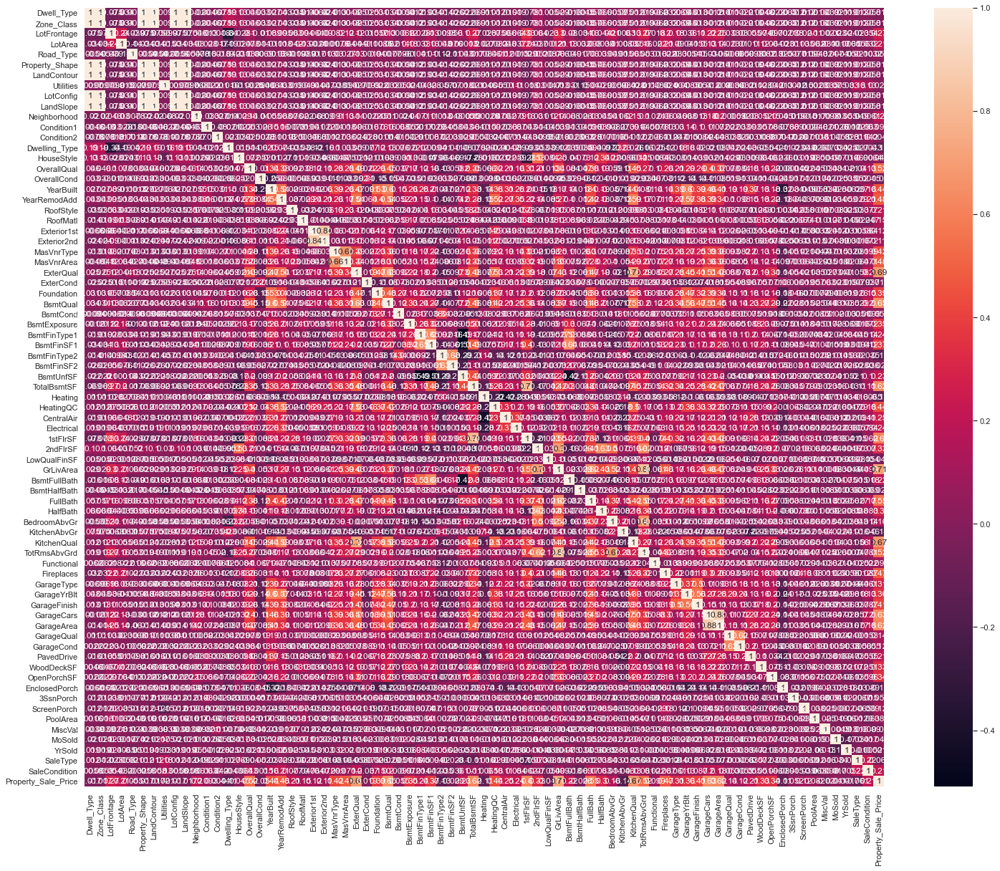

In [109]:
sns.set(rc={"figure.figsize":(25, 20)})
sns.heatmap(pdata.corr(), annot=True)

### Sampling

In [50]:
#Sampling
from sklearn.model_selection import train_test_split
pdata_train,pdata_test = train_test_split(pdata, test_size=.2)

In [51]:
pdata_train_x = pdata_train.iloc[:,0:-1]
pdata_train_y = pdata_train.iloc[:,-1]

In [52]:
pdata_test_x = pdata_test.iloc[:,0:-1]
pdata_test_y = pdata_test.iloc[:,-1]

### Modeling

In [53]:
from sklearn.linear_model import LinearRegression
reg_data = LinearRegression()
reg_data.fit(pdata_train_x,pdata_train_y)

LinearRegression()

In [54]:
Rsquare = reg_data.score(pdata_train_x,pdata_train_y)
Rsquare

0.8705268513368325

In [55]:
n=pdata_train_x.shape[0]
k=pdata_train_x.shape[1]

In [56]:
adjRsquare = 1 - (1-Rsquare)*(n-1)/ (n-k-1)
adjRsquare 

0.8644744110329321

In [57]:
feature_slope = pd.DataFrame({'Columns':pdata_train_x.columns,'Slope':reg_data.coef_})
feature_slope.sort_values('Slope')

,Columns,Slope
50,KitchenAbvGr,-25589.122862
12,Condition2,-10031.986377
49,BedroomAbvGr,-6224.290324
46,BsmtHalfBath,-3788.196806
13,Dwelling_Type,-3648.720987
37,Heating,-3086.406355
39,CentralAir,-2967.959699
26,ExterCond,-2684.003530
14,HouseStyle,-1785.493033
23,MasVnrType,-1758.162230


In [58]:
pred_train = reg_data.predict(pdata_train_x)
pred_test = reg_data.predict(pdata_test_x)

In [60]:
error_train = pdata_train_y - pred_train
error_test = pdata_test_y - pred_test

In [61]:
np.mean(error_train) # mean close to zero

-7.674423809218321e-11

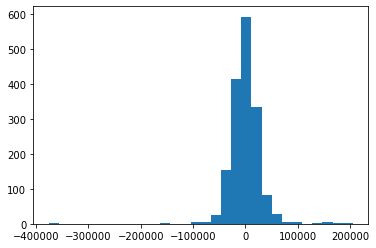

In [62]:
plt.hist(error_train ,bins = 30);

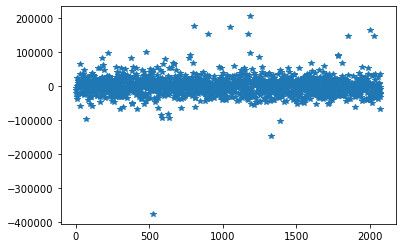

In [63]:
plt.plot(error_train,'*')

In [66]:
pred_actual = pd.DataFrame({"Predict":pred_test,"Actual":pdata_test_y})
pred_actual

,Predict,Actual
1753,144316.047503,142000
726,225254.988837,222000
127,80452.088384,87000
5,182738.888077,143000
1326,92989.218064,79000
1208,131526.754062,140000
1715,118308.795029,125500
202,116686.683340,112000
1360,200632.067377,189000
1588,137590.475581,141000


C:\Users\NITIN\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


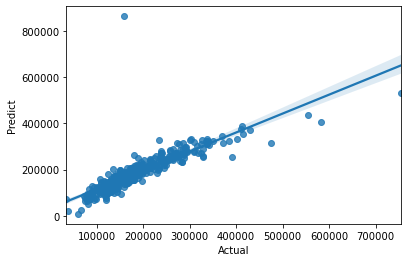

In [67]:
sns.regplot('Actual','Predict',data= pred_actual);

In [68]:
# mape 
mape_test= np.mean(np.abs(error_test*100/pdata_test_y))
mape_test

12.28108778829413

### Accuracy of the Model

In [69]:
Acc = 100- mape_test
Acc

87.71891221170587

## <-------------------------------------------------------END------------------------------------------------------------>